In [1]:
import glob
import os
import pandas as pd
import PIL 
from PIL import Image, ImageDraw
from collections import Counter
import numpy as np
from helpers import read_project_variables, return_whole_dataset, count_IoU
variables = read_project_variables()

### How to read dataset

- each row in dataset has three elements: 
    - PIL object of an image
    - array of bounding boxes (xmin, ymin, xmax, ymax)
    - array of classes

In [2]:
dataset = return_whole_dataset()

100%|████████████████████████████████████████████████████████████████████████████████| 203/203 [00:11<00:00, 16.93it/s]


['5zl', '1gr', '1gr', '2gr', '2gr']


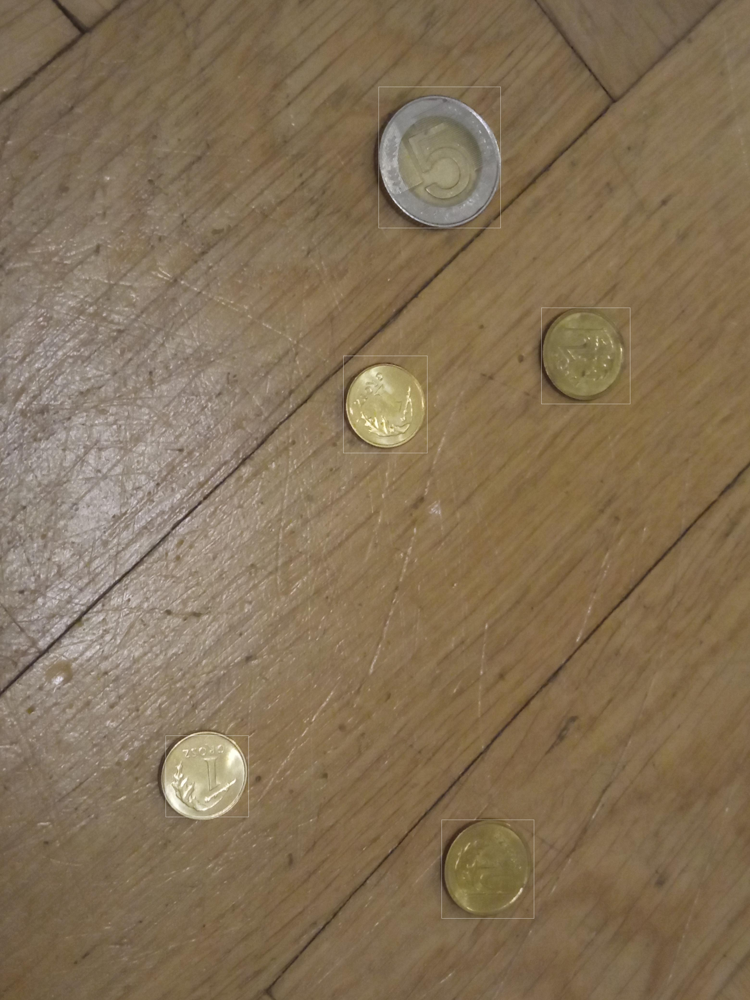

In [3]:
image = ImageDraw.Draw(dataset[0][0])
for bb in dataset[0][1]:
    image.rectangle(bb)
print(dataset[0][2])
dataset[0][0]

### How to read dataset that is histogram equalized (it takes a while) 

In [4]:
dataset = return_whole_dataset(use_hist_equalization=True)

100%|████████████████████████████████████████████████████████████████████████████████| 203/203 [02:27<00:00,  1.38it/s]


['5zl', '1gr', '1gr', '2gr', '2gr']


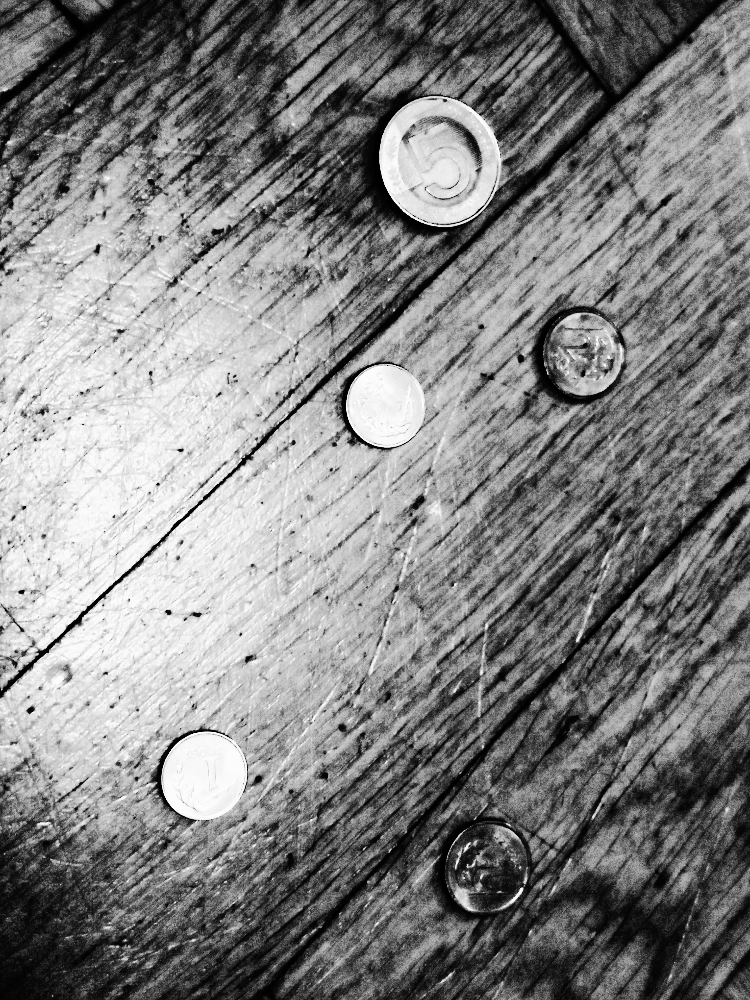

In [10]:
image = ImageDraw.Draw(dataset[0][0])
for bb in dataset[0][1]:
    image.rectangle(bb)
print(dataset[0][2])
dataset[0][-1]

### Detecting circles should be easier on equalized images (at least in theory) 

### To calculate intersection over union use this function: 
    - as first argument provide array of CALCULATED bounding boxes in form: (xmin, ymin, xmax, ymax)
    - as second argument provide array of TRUE bounding boxes
    don't worry about order of those boxes, this functions finds the best pairs possible

In [2]:
count_IoU([(50,50, 100, 100),
          (0,0, 25, 25)], 
          
         [(50,50, 100, 100), 
         (0,0, 25, 25)])

[1.0, 1.0]

In [3]:
count_IoU([(50,50, 100, 100),
          (0,0, 25, 25)], 
          
         [(61,49, 98, 101), 
         (0,0, 25, 25)])

[0.7239447142323496, 1.0]

- after switching orders of second bounding boxes result is the same 

In [4]:
count_IoU([(50,50, 100, 100),
          (0,0, 25, 25)], 
          
         [(0,0, 25, 25), 
          (61,49, 98, 101)])

[0.7239447142323496, 1.0]

- Number of bounding boxes can differ

In [5]:
count_IoU([(50,50, 100, 100)], 
          
         [(0,0, 25, 25), 
          (61,49, 98, 101)])

[0.7239447142323496, 0]

In [6]:
count_IoU([(50,50, 100, 100),
          (0,0, 25, 25), (0,0, 25, 25)], 
          
         [(0,0, 25, 25), 
          (61,49, 98, 101)])

[1.0, 0.7239447142323496, 0]

In [7]:
grant_truth= [[1147, 1780, 1526, 2160],
             [2082, 900, 2406, 1265],
             [1792, 1560, 2066, 1845],
             [2342, 2245, 2681, 2600],
             [2022, 2950, 2421, 3365]]

In [8]:
segmented = [[1170, 1803, 1492, 2125], [2043, 2968, 2403, 3328], [2347, 2257, 2669, 2579]]

In [9]:
count_IoU(segmented, grant_truth)

[0.7206036745406824, 0.7831790865384616, 0.861938202247191, 0, 0]

In [10]:
count_IoU(grant_truth,segmented)

[0.7206036745406824, 0.7831790865384616, 0.861938202247191, 0, 0]